In [1]:
import cmath
import math
import meep as mp
from meep.materials import Ag
import numpy as np
import matplotlib.pyplot as plt

-----------
Initializing structure...
time for choose_chunkdivision = 6.50883e-05 s
Working in 2D dimensions.
Computational cell is 0.1 x 4 x 0 with resolution 200
time for set_epsilon = 0.015656 s
-----------
field decay(t = 50.0025): 0.2498128107023834 / 0.2498128107023834 = 1.0
on time step 36297 (time=90.7425), 0.000110202 s/step
field decay(t = 100.0025): 1.182366666280928e-16 / 0.2498128107023834 = 4.733010540798688e-16
run 0 finished at t = 100.0025 (40001 timesteps)
-----------
Initializing structure...
time for choose_chunkdivision = 6.00815e-05 s
Working in 2D dimensions.
Computational cell is 0.1 x 4 x 0 with resolution 200
     block, center = (0,0,0)
          size (0.01,0.05,1e+20)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     block, center = (0,1.0125,0)
          size (0.1,1.975,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (2.25,2.25,2.25)
time for set_epsilon = 0.03

/tmp/ipykernel_155/4242118098.py:88: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


field decay(t = 50.0025): 0.2498128107023834 / 0.2498128107023834 = 1.0
on time step 30701 (time=76.7525), 0.000130294 s/step
field decay(t = 100.0025): 1.182366666280928e-16 / 0.2498128107023834 = 4.733010540798688e-16
run 0 finished at t = 100.0025 (40001 timesteps)
-----------
Initializing structure...
time for choose_chunkdivision = 0.00012207 s
Working in 2D dimensions.
Computational cell is 0.1 x 4 x 0 with resolution 200
     block, center = (0,0,0)
          size (0.052,0.05,1e+20)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     block, center = (0,1.0125,0)
          size (0.1,1.975,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (2.25,2.25,2.25)
time for set_epsilon = 0.042383 s
lorentzian susceptibility: frequency=16.365, gamma=1.95106
lorentzian susceptibility: frequency=7.32593, gamma=0.738804
lorentzian susceptibility: frequency=6.60165, gamma=0.052426
lorentzian susceptibil

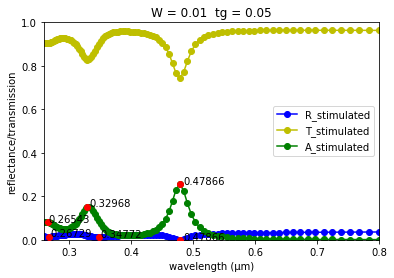

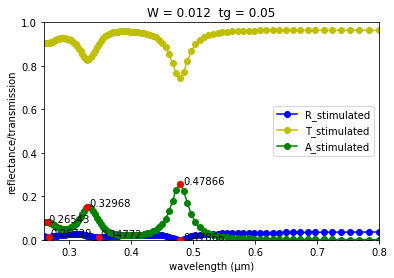

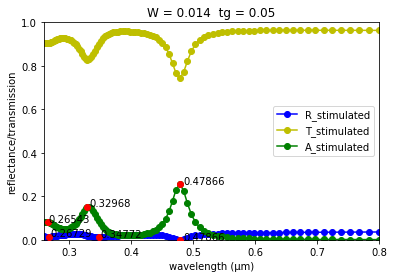

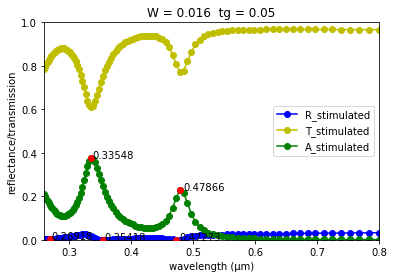

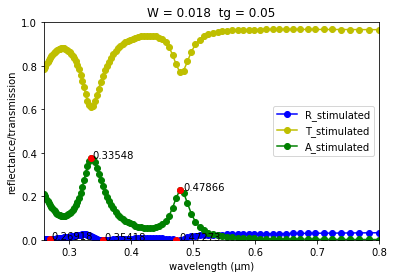

...

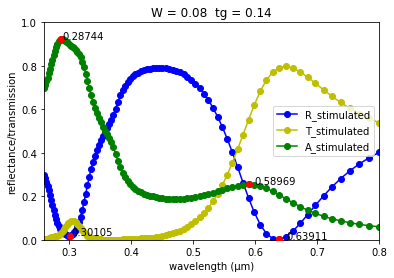

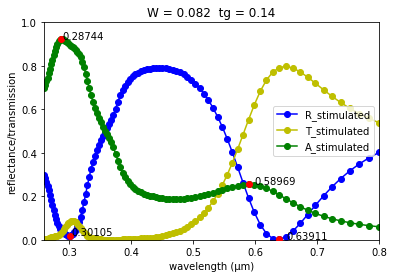

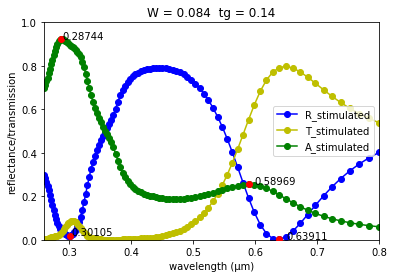

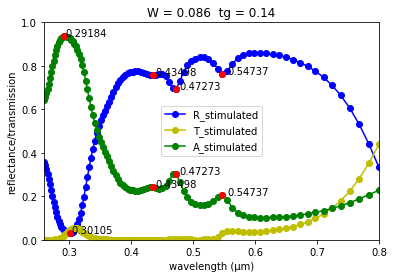

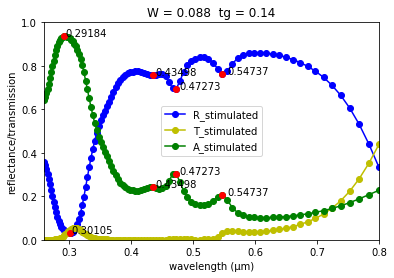

In [12]:
for tg_ in range(5,15,1):
    tg=tg_/100
    for W_ in range(10,90,2):
        W = W_/1000
        P=0.1
        ns=1.5
        celly=3

        k_point=mp.Vector3(0,0,0)
        cellx=P
        dpml = 0.5  # thickness of PML layers
        cell = mp.Vector3(cellx,celly+2*dpml,0)


        pml_layers = [mp.PML(dpml,mp.Y)]
        resolution = 200

        wvl_min = 0.26
        wvl_max = 0.8
        fmin = 1/wvl_max
        fmax = 1/wvl_min
        fcen = 0.5*(fmax+fmin)
        df = fmax-fmin
        nfreq = 100

        geometry =[mp.Block(size=mp.Vector3(W,tg,mp.inf),
                             center=mp.Vector3(0,0,0),
                             material=Ag),
                  mp.Block(size=mp.Vector3(P,(celly-tg)/2+dpml),
                             center=mp.Vector3(0,(celly+tg+2*dpml)/4,0),
                             material=mp.Medium(index=ns))]

        sources = [mp.Source(
                src=mp.GaussianSource(fcen, fwidth=df),
                component=mp.Ex,
                center=mp.Vector3(0,celly/2,0),
                size=mp.Vector3(cellx,0,0),
            )]

        sim = mp.Simulation(
            cell_size=cell,
            sources=sources,
            boundary_layers=pml_layers,
            resolution=resolution,
            default_material=mp.Medium(index=ns),
            k_point=k_point
        )

        tran_fr = mp.FluxRegion(center=mp.Vector3(0,-celly/2+0.1,0),size=mp.Vector3(cellx,0,0))
        tran = sim.add_flux(fcen, df, nfreq, tran_fr)
        refl_fr = mp.FluxRegion(center=mp.Vector3(0,+celly/2-0.1,0),size=mp.Vector3(cellx,0,0))
        refl = sim.add_flux(fcen, df, nfreq, refl_fr)
        
        sim.run(until_after_sources=mp.stop_when_fields_decayed(50, mp.Hz, mp.Vector3(0,-celly/2,0), 1e-3))

        empty_tran_flux = mp.get_fluxes(tran)
        empty_tran_data = sim.get_flux_data(tran)
        empty_refl_flux = mp.get_fluxes(refl)
        empty_refl_data = sim.get_flux_data(refl)
        sim.reset_meep()

        sim = mp.Simulation(
            cell_size=cell,
            sources=sources,
            geometry=geometry,
            boundary_layers=pml_layers,
            resolution=resolution,
            default_material=mp.Medium(index=1),
            k_point=k_point
        )
        
        tran = sim.add_flux(fcen, df, nfreq, tran_fr)
        #sim.load_minus_flux_data(tran, empty_tran_data)

        refl = sim.add_flux(fcen, df, nfreq, refl_fr)
        sim.load_minus_flux_data(refl, empty_refl_data)

        sim.run(until_after_sources=mp.stop_when_fields_decayed(50, mp.Hz, mp.Vector3(0,-1.5,0), 1e-3))

        refl_flux = mp.get_fluxes(refl)
        R_meep = -1*np.divide(refl_flux,empty_refl_flux)
        tran_flux = mp.get_fluxes(tran)
        T_meep = 1*np.divide(tran_flux,empty_tran_flux)
        freqs = mp.get_flux_freqs(refl)
        wvls = np.divide(1,freqs)
        
        
        plt.figure()

        A_meep=1-T_meep-R_meep

        plt.xlabel("wavelength (μm)")
        plt.ylabel("reflectance/transmission")
        plt.plot(wvls,R_meep,'bo-',zorder=0,label="R_stimulated")
        plt.plot(wvls,T_meep,'yo-',zorder=0,label="T_stimulated")
        plt.plot(wvls,A_meep,'go-',zorder=0,label="A_stimulated")
        for i in range(len(A_meep)-2):
            if A_meep[i]<A_meep[i+1] and A_meep[i+2]<A_meep[i+1]:
                plt.scatter(wvls[i+1],A_meep[i+1],color="r",zorder=8)
                plt.annotate(round(wvls[i+1],5),(wvls[i],A_meep[i+1]),zorder=10)
        for i in range(len(R_meep)-2):
            if R_meep[i]>R_meep[i+1] and R_meep[i+2]>R_meep[i+1]:
                plt.scatter(wvls[i+1],R_meep[i+1],color="r",zorder=8)
                plt.annotate(round(wvls[i+1],5),(wvls[i],R_meep[i+1]),zorder=10)
        plt.axis([np.min(wvls), np.max(wvls), 0,1])
        plt.title("W = "+str(W)+'  tg = '+str(tg))
        plt.legend()
        plt.savefig('Graphs_1006/tg={}_W={}.png'.format(tg,W))